### Data prep

In [1]:
import numpy as np
import xarray as xr
import pandas as pd

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy
import seaborn as sns

import clustering_functions as cf
from matplotlib.patches import Rectangle

from sklearn.metrics import adjusted_mutual_info_score

ModuleNotFoundError: No module named 'clustering_functions'

In [ ]:
g0 = 9.80665
extended_winter_months = [11, 12, 1, 2, 3]
winter_months = [12, 1, 2]

In [ ]:
def calculate_conditional_probability_change(threshold_matrix, labels, comparison, shift_value=0):
    
    # add cluster assignment to threshold vector
    threshold_matrix_label = threshold_matrix.assign_coords(label=("time", np.roll(labels, shift_value)))

    # probability conditional on weather type
    n_wr = threshold_matrix_label.groupby('label').mean()

    # overall probability
    n_total = threshold_matrix_label.mean(dim='time')
    
    if comparison=='difference':
        ds = n_wr - n_total
    elif comparison=='ratio':
        ds = n_wr/n_total
    elif comparison=='none':
        ds = n_wr
    else:
        print('invalid entry for diff_or_quot')
        
    return(ds)

**selected cluster number**

In [12]:
k=5

pr_spatial = xr.open_dataset('../targeted_clustering/results.nosync/CHIRPS_precip_targets/total_precip_EW.nc')['precipitation_amount']
pr_spatial = pr_spatial.where(pr_spatial['time.year'] < 2023, drop=True)

time_values = pd.DataFrame(pr_spatial['time'].values)
time_values = time_values.rename(columns={0: 'date'})

In [13]:
filepath_results = '../targeted_clustering/results.nosync/model_specifications_and_results/'

labels_pca = pd.read_csv(filepath_results+'pca_kmeans/v924/cluster_labels_'+str(k)+'_preciporder.csv')[['label']]
labels_pca = labels_pca.rename(columns={"label": "pca_labels"})

labels_cmm = pd.read_csv(filepath_results+'cmm_vae/v924/v1/cluster_probabilities_'+str(k)+'_preciporder.csv')[['label']]
labels_cmm = labels_cmm.rename(columns={"label": "cmm_labels"})

labels_cca = pd.read_csv(filepath_results+'cca_kmeans/v1024/cluster_labels_'+str(k)+'_preciporder.csv')[['label']]
labels_cca = labels_cca.rename(columns={"label": "cca_labels"})

regime_labels = pd.concat([time_values, labels_pca, labels_cca, 
                           labels_cmm], axis=1) 

## MJO

In [14]:
mjo = pd.read_csv('../data.nosync/Indices/mjo.txt', header=None, delim_whitespace=True)
mjo = mjo.rename(columns={0: "year", 1: "month", 2: 'day', 3: 'RMM1', 4: 'RMM2', 5: 'mjo phase', 6: 'mjo amplitude'})
mjo['date'] = pd.to_datetime(mjo[['year', 'month', 'day']])
mjo_reduced = mjo[['date', 'year', 'month', 'day', 'mjo phase', 'mjo amplitude', 'RMM1', 'RMM2']]

mjo_reduced['mjo phase revised']=0

for i in range(len(mjo_reduced)):
    if mjo_reduced['mjo amplitude'][i]>1.0:
        mjo_reduced['mjo phase revised'][i]=mjo_reduced['mjo phase'][i]
        
mjo_frequency = mjo_reduced[['mjo phase revised']]
mjo_frequency['count']=1
mjo_frequency = mjo_frequency.groupby('mjo phase revised').sum()/len(mjo_reduced)
mjo_frequency = mjo_frequency.reset_index()
mjo_frequency = mjo_frequency[mjo_frequency["mjo phase revised"]!=999]

# merge regimes with MJO data
mjo_regimes = regime_labels.merge(mjo_reduced, left_on='date', right_on='date')

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2108362704.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mjo_reduced['mjo phase revised'][i]=mjo_reduced['mjo phase'][i]
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2108362704.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mjo_frequency['count']=1


In [54]:
rng = np.random.default_rng(seed=123)

def cassou_analysis(label_names, sample_n=500, sample_fraction=1, 
                    max_shift_value=20, indices_data = mjo_regimes, k=5):

    cassou = indices_data[['year', 'month','day', 'date', 'mjo phase revised', label_names]]
    cassou = cassou.rename(columns={'mjo phase revised': "mjo phase"})

    # assign season
    cassou['season']=0
    n=1
    for i in range(len(cassou)):
        cassou['season'][i]=n
        if ((cassou['month'][i]==3) and (cassou['day'][i]==31)):
            n=n+1

    shifted_list = []

    for season in cassou['season'].unique():

        filtered = cassou[cassou['season']==season]

        for shift_value in range(max_shift_value):
            filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)

        shifted_list.append(filtered)

    cassou_shifted = pd.concat(shifted_list)

    cassou_shifted = cassou_shifted.drop(columns=['month', 'day', 'year'])

    cassou_shifted = pd.melt(cassou_shifted, 
                id_vars=['season', 'date', 'mjo phase'], 
                value_vars=list(cassou_shifted.columns[4:]),
                var_name='shift', 
                value_name='shifted_label')

    sampled_cassous_ls = []

    for i in range(sample_n):
        
        random_sample = cassou_shifted['season'].sample(n=40, replace=True, random_state=rng).values.tolist()
        
        cassou_sampled_ls = []
        
        for j in range(40):
            
            season = random_sample[j]
    
            cassou_sampled_ls.append(cassou_shifted[cassou_shifted['season']==season])
        
        cassou_sampled = pd.concat(cassou_sampled_ls)
        #cassou_sampled = cassou_shifted[cassou_shifted['season'].isin(seasons_sample)]
        #cassou_sampled = cassou_shifted.sample(frac=sample_fraction, replace=True, random_state=rng)

        cassou_conditional_count = (cassou_sampled.groupby(['mjo phase', 'shift'])[['shifted_label']].value_counts().to_frame()).reset_index(level=['mjo phase', 'shift', 'shifted_label']).rename(columns={0: "count"})
        cassou_conditional_total = cassou_conditional_count.groupby(['mjo phase', 'shift'])[['count']].sum().reset_index(level=['mjo phase', 'shift']).rename(columns={'count': "total count"})

        cassou_conditional = cassou_conditional_count.merge(cassou_conditional_total, on=['mjo phase', 'shift'])
        cassou_conditional['conditional_pc'] = cassou_conditional['count'] / cassou_conditional['total count']
        cassou_conditional['shift'] = cassou_conditional['shift'].astype(int)

        cassou_unconditional_count = (cassou_sampled.groupby(['shift'])[['shifted_label']].value_counts().to_frame()).reset_index(level=['shift', 'shifted_label']).rename(columns={0: "count"})
        cassou_unconditional_total = cassou_unconditional_count.groupby(['shift'])[['count']].sum().reset_index(level=['shift']).rename(columns={'count': "total count"})

        cassou_unconditional = cassou_unconditional_count.merge(cassou_unconditional_total, on=['shift'])
        cassou_unconditional['unconditional_pc'] = cassou_unconditional['count'] / cassou_unconditional['total count']
        cassou_unconditional['shift'] = cassou_unconditional['shift'].astype(int)

        cassou_merged = cassou_conditional.merge(cassou_unconditional, on=['shift', 'shifted_label'])
        cassou_merged['probability_change'] = 100*(cassou_merged['conditional_pc']-cassou_merged['unconditional_pc'])/cassou_merged['unconditional_pc']
        cassou_merged = cassou_merged[['mjo phase', 'shift', 'shifted_label', 'unconditional_pc', 'conditional_pc', 'probability_change']]

        cassou_merged['shifted_label'] = cassou_merged['shifted_label'].astype(int)
        cassou_merged['sample']=i
        sampled_cassous_ls.append(cassou_merged)

    sampled_cassous = pd.concat(sampled_cassous_ls)
    
    probability_cassou_ls = []

    for mjo_phase in range(9):
        for shift_value in range(max_shift_value):
            for label in range(k):

                data = sampled_cassous[sampled_cassous['mjo phase']==mjo_phase]
                data = data[data['shift']==shift_value]
                data = data[data['shifted_label']==label]

                mean = data['probability_change'].mean()
                pc_975 = data['probability_change'].quantile(0.95)
                pc_025 = data['probability_change'].quantile(0.05)

                if np.sign(pc_025)==np.sign(pc_975):
                    significance = 1
                else:
                    significance = 0

                probability_cassou_ls.append(pd.DataFrame(data={
                    "mjo phase": [mjo_phase],
                    "shift": [shift_value],
                    "label": [label],
                    "mean": [mean],
                    "significance": [significance]}))

    probability_cassou = pd.concat(probability_cassou_ls)
    
    return(sampled_cassous, probability_cassou)

#### PCA

In [55]:
sampled_cassou_pca, probabilities_cassou_pca = cassou_analysis(label_names = 'pca_labels', k=k,
                                                               sample_n=500, max_shift_value=47)

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season'][i]=n
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value

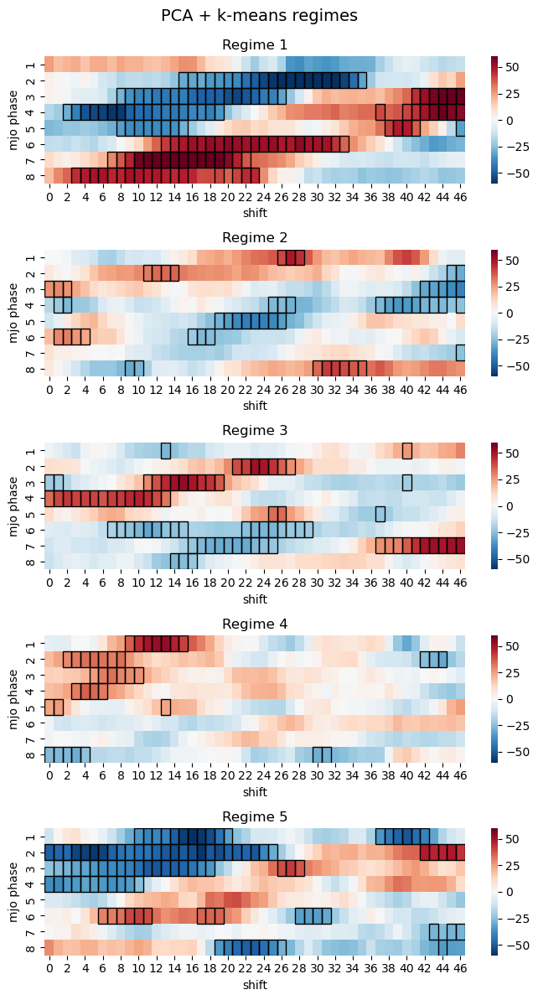

In [56]:
chosen_cluster_number = k

fig, axes = plt.subplots(chosen_cluster_number, 1, figsize=(7, 12))

for i in range(chosen_cluster_number):

    plot_data = probabilities_cassou_pca[probabilities_cassou_pca['label']==i]
    plot_data = plot_data[plot_data['mjo phase']!=0]
    heatmap_data = pd.pivot_table(plot_data, values='mean', index=['mjo phase'], columns='shift')
    
    g = sns.heatmap(heatmap_data, cmap='RdBu_r', square=False, ax = axes[i], vmin=-60, vmax = 60)
    g.set_title('Regime '+str(i+1))
    for index, row in plot_data[plot_data['significance'] == 1].iterrows():
        name_pos = heatmap_data.index.get_loc(row['mjo phase'])
        id_pos = heatmap_data.columns.get_loc(row['shift'])
        g.add_patch(Rectangle((id_pos, name_pos), 1, 1, ec='black', fc='none', lw=1))
        
fig.suptitle('PCA + k-means regimes', fontsize=14, x=0.45, y=0.99)
plt.tight_layout()
plt.savefig('results_section3_1024/mjo_pca_'+str(k)+'_percentage.png') 

#### Quantify mutual / conditional information

In [57]:
sampled_cassou_pca_mjo = sampled_cassou_pca.merge(mjo_frequency, left_on='mjo phase', right_on='mjo phase revised')
sampled_cassou_pca_mjo = sampled_cassou_pca_mjo[sampled_cassou_pca_mjo['mjo phase']!=0]

ce_pca_ls = []

for shift in range(47):
    
    probs = sampled_cassou_pca_mjo[sampled_cassou_pca_mjo['shift']==shift]
    
    for i in range(100):
        
        sample_runs = probs['sample'].sample(n=400, replace=True, random_state=rng).values.tolist()
        sampled = probs[probs['sample'].isin(sample_runs)]

        conditional_entropy = -np.mean(np.log2(sampled['conditional_pc']).values * sampled['conditional_pc'].values * sampled['count'].values)
        
        ce_df = pd.DataFrame(data={'Shift': [shift], 'Conditional Entropy': [conditional_entropy]})
        ce_pca_ls.append(ce_df)
        
ce_pca_df = pd.concat(ce_pca_ls)
ce_pca_df['Method']='PCA'

#### CMM-VAE

In [60]:
sampled_cassou_cmmvae, probabilities_cassou_cmmvae = cassou_analysis(label_names = 'cmm_labels', 
                                                                     k=k, sample_n=500, 
                                                                     max_shift_value=47)

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season'][i]=n
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value

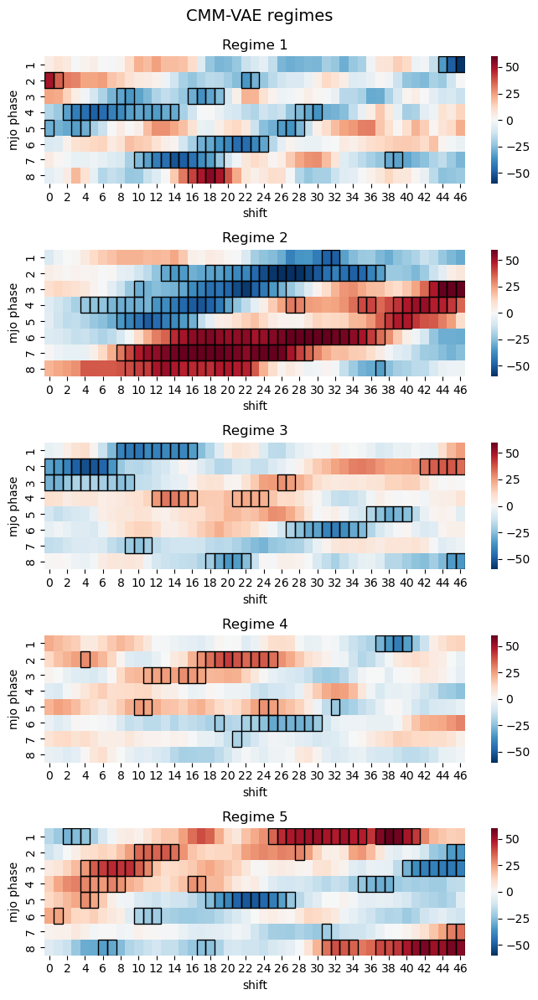

In [61]:
chosen_cluster_number = k

fig, axes = plt.subplots(chosen_cluster_number, 1, figsize=(7, 12))

for i in range(chosen_cluster_number):

    plot_data = probabilities_cassou_cmmvae[probabilities_cassou_cmmvae['label']==i]
    plot_data = plot_data[plot_data['mjo phase']!=0]
    heatmap_data = pd.pivot_table(plot_data, values='mean', index=['mjo phase'], columns='shift')
    
    g = sns.heatmap(heatmap_data, cmap='RdBu_r', square=False, ax = axes[i], vmin=-60, vmax = 60)
    g.set_title('Regime '+str(i+1))
    for index, row in plot_data[plot_data['significance'] == 1].iterrows():
        name_pos = heatmap_data.index.get_loc(row['mjo phase'])
        id_pos = heatmap_data.columns.get_loc(row['shift'])
        g.add_patch(Rectangle((id_pos, name_pos), 1, 1, ec='black', fc='none', lw=1))
        

fig.suptitle('CMM-VAE regimes', fontsize=14, x=0.45, y=0.99)
plt.tight_layout()
plt.savefig('results_section3_1024/mjo_cmm_'+str(k)+'_percentage.png')

In [62]:
sampled_cassou_cmmvae_mjo = sampled_cassou_cmmvae.merge(mjo_frequency, left_on='mjo phase', right_on='mjo phase revised')
sampled_cassou_cmmvae_mjo = sampled_cassou_cmmvae_mjo[sampled_cassou_cmmvae_mjo['mjo phase']!=0]

ce_cmm_ls = []

for shift in range(47):
    
    probs = sampled_cassou_cmmvae_mjo[sampled_cassou_cmmvae_mjo['shift']==shift]
    
    for i in range(100):
        
        sample_runs = probs['sample'].sample(n=400, replace=True, random_state=rng).values.tolist()
        sampled = probs[probs['sample'].isin(sample_runs)]

        conditional_entropy = -np.mean(np.log2(sampled['conditional_pc']).values * sampled['conditional_pc'].values * sampled['count'].values)
        
        ce_df = pd.DataFrame(data={'Shift': [shift], 'Conditional Entropy': [conditional_entropy]})
        ce_cmm_ls.append(ce_df)
        
ce_cmm_df = pd.concat(ce_cmm_ls)
ce_cmm_df['Method']='CMM-VAE'

#### CCA

In [63]:
sampled_cassou_cca, probabilities_cassou_cca = cassou_analysis(label_names = 'cca_labels', 
                                                               k=k, sample_n=500, max_shift_value=47)

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season'][i]=n
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_names].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/565971141.py:24: SettingWithCopyWarning: 
A value

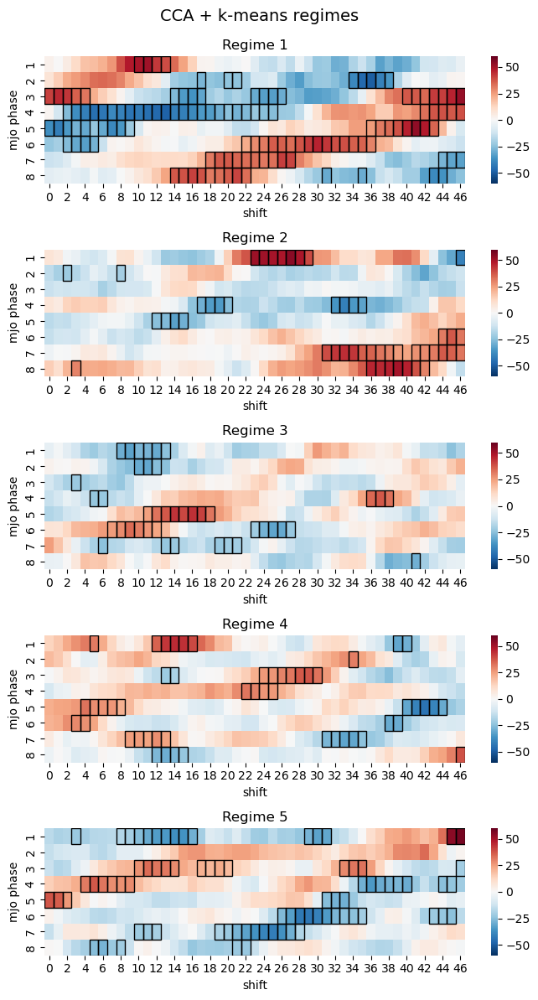

In [64]:
chosen_cluster_number = k
fig, axes = plt.subplots(chosen_cluster_number, 1, figsize=(7, 12))

for i in range(chosen_cluster_number):

    plot_data = probabilities_cassou_cca[probabilities_cassou_cca['label']==i]
    plot_data = plot_data[plot_data['mjo phase']!=0]
    heatmap_data = pd.pivot_table(plot_data, values='mean', index=['mjo phase'], columns='shift')
    
    g = sns.heatmap(heatmap_data, cmap='RdBu_r', square=False, ax = axes[i], vmin=-60, vmax = 60)
    g.set_title('Regime '+str(i+1))
    for index, row in plot_data[plot_data['significance'] == 1].iterrows():
        name_pos = heatmap_data.index.get_loc(row['mjo phase'])
        id_pos = heatmap_data.columns.get_loc(row['shift'])
        g.add_patch(Rectangle((id_pos, name_pos), 1, 1, ec='black', fc='none', lw=1))
        
fig.suptitle('CCA + k-means regimes', fontsize=14, x=0.45, y=0.99)

plt.tight_layout()
plt.savefig('results_section3_1024/mjo_cca_'+str(k)+'_percentage.png') 

In [65]:
sampled_cassou_cca_mjo = sampled_cassou_cca.merge(mjo_frequency, left_on='mjo phase', right_on='mjo phase revised')
sampled_cassou_cca_mjo = sampled_cassou_cca_mjo[sampled_cassou_cca_mjo['mjo phase']!=0]


ce_cca_ls = []

for shift in range(47):
    
    probs = sampled_cassou_cca_mjo[sampled_cassou_cca_mjo['shift']==shift]
    
    for i in range(100):
        
        sample_runs = probs['sample'].sample(n=400, replace=True, random_state=rng).values.tolist()
        sampled = probs[probs['sample'].isin(sample_runs)]

        conditional_entropy = -np.mean(np.log2(sampled['conditional_pc']).values * sampled['conditional_pc'].values * sampled['count'].values)
        
        ce_df = pd.DataFrame(data={'Shift': [shift], 'Conditional Entropy': [conditional_entropy]})
        ce_cca_ls.append(ce_df)
        
ce_cca_df = pd.concat(ce_cca_ls)
ce_cca_df['Method']='CCA'

### Conditional entropy plot

In [66]:
conditional_entropy_total = pd.concat([ce_pca_df, ce_cca_df, ce_cmm_df])

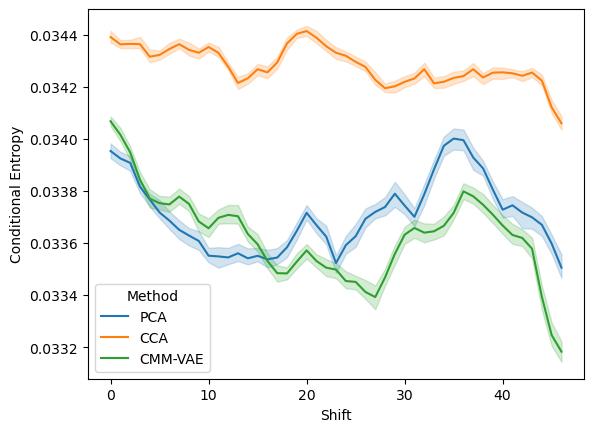

In [67]:
conditional_entropy_total = pd.concat([ce_pca_df, ce_cca_df, ce_cmm_df])
conditional_entropy_total.to_csv('results_section3_0924/mjo_regimes_'+str(k)+'_conditionalentropy.csv')
sns.lineplot(conditional_entropy_total, x='Shift', y='Conditional Entropy', hue='Method', errorbar=('pi', 100))
plt.savefig('results_section3_1024/mjo_regimes_'+str(k)+'_conditionalentropy.png')

that above should be the 95th percentile confidence interval, I just made my life a bit harder than it would had to have been

## SPV

In [68]:
spv = xr.open_dataset('../data.nosync/spv/era5_u100_daily_zonalmean_1980_2022.nc')['u'].dropna(dim='time')
spv = spv.where(spv['time.year'] > 1980, drop=True)
spv_terciles = np.searchsorted([np.quantile(spv.values, 0.33), np.quantile(spv.values, 0.66)], spv)

In [69]:
spv_regimes = mjo_regimes[mjo_regimes['month']!=11]
spv_regimes = spv_regimes[['date', 'pca_labels', 'cca_labels', 'cmm_labels', 'year', 'month', 'day']]
spv_regimes['spv']=spv_terciles
spv_regimes = spv_regimes.reset_index()

In [70]:
rng = np.random.default_rng(seed=123)

def spv_cassou_analysis(indices_data, label_name, sample_n=500, sample_fraction=0.8, 
                    max_shift_value=20, k=5, spv_states=3):

    cassou = indices_data[['year', 'month', 'day', 'date', 'spv', label_name]]

    # assign season
    cassou['season']=0
    n=1
    for i in range(len(cassou)):
        cassou['season'][i]=n
        if ((cassou['month'][i]==3) and (cassou['day'][i]==31)):
            n=n+1

    shifted_list = []

    for season in cassou['season'].unique():

        filtered = cassou[cassou['season']==season]

        for shift_value in range(max_shift_value):
            filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)

        shifted_list.append(filtered)

    cassou_shifted = pd.concat(shifted_list)
    
    cassou_shifted = cassou_shifted.drop(columns=['month', 'day', 'year'])

    cassou_shifted = pd.melt(cassou_shifted, 
                id_vars=['season', 'date', 'spv'], 
                value_vars=list(cassou_shifted.columns[4:]),
                var_name='shift', 
                value_name='shifted_label')

    sampled_cassous_ls = []

    for i in range(sample_n):

        random_sample = cassou_shifted['season'].sample(n=40, replace=True, random_state=rng).values.tolist()
        
        cassou_sampled_ls = []
        
        for j in range(40):
            
            season = random_sample[j]
    
            cassou_sampled_ls.append(cassou_shifted[cassou_shifted['season']==season])
        
        cassou_sampled = pd.concat(cassou_sampled_ls)
        
        #seasons_sample = cassou_shifted['season'].sample(n=40, replace=True, random_state=rng).values.tolist()
        #cassou_sampled = cassou_shifted[cassou_shifted['season'].isin(seasons_sample)]
        #cassou_sampled = cassou_shifted.sample(frac=sample_fraction, replace=True, random_state=rng)

        cassou_conditional_count = (cassou_sampled.groupby(['spv', 'shift'])[['shifted_label']].value_counts().to_frame()).reset_index(level=['spv', 'shift', 'shifted_label']).rename(columns={0: "count"})
        cassou_conditional_total = cassou_conditional_count.groupby(['spv', 'shift'])[['count']].sum().reset_index(level=['spv', 'shift']).rename(columns={'count': "total count"})

        cassou_conditional = cassou_conditional_count.merge(cassou_conditional_total, on=['spv', 'shift'])
        cassou_conditional['conditional_pc'] = cassou_conditional['count'] / cassou_conditional['total count']
        cassou_conditional['shift'] = cassou_conditional['shift'].astype(int)

        cassou_unconditional_count = (cassou_sampled.groupby(['shift'])[['shifted_label']].value_counts().to_frame()).reset_index(level=['shift', 'shifted_label']).rename(columns={0: "count"})
        cassou_unconditional_total = cassou_unconditional_count.groupby(['shift'])[['count']].sum().reset_index(level=['shift']).rename(columns={'count': "total count"})

        cassou_unconditional = cassou_unconditional_count.merge(cassou_unconditional_total, on=['shift'])
        cassou_unconditional['unconditional_pc'] = cassou_unconditional['count'] / cassou_unconditional['total count']
        cassou_unconditional['shift'] = cassou_unconditional['shift'].astype(int)

        cassou_merged = cassou_conditional.merge(cassou_unconditional, on=['shift', 'shifted_label'])
        cassou_merged['probability_change'] = 100*(cassou_merged['conditional_pc']-cassou_merged['unconditional_pc'])/cassou_merged['unconditional_pc']
        cassou_merged = cassou_merged[['spv', 'shift', 'shifted_label', 'unconditional_pc', 'conditional_pc', 'probability_change']]

        cassou_merged['shifted_label'] = cassou_merged['shifted_label'].astype(int)
        cassou_merged['sample']=i
        sampled_cassous_ls.append(cassou_merged)

    sampled_cassous = pd.concat(sampled_cassous_ls)
    
    probability_cassou_ls = []

    for spv in range(spv_states):
        for shift_value in range(max_shift_value):
            for label in range(k):

                data = sampled_cassous[sampled_cassous['spv']==spv]
                data = data[data['shift']==shift_value]
                data = data[data['shifted_label']==label]

                mean = data['probability_change'].mean()
                pc_975 = data['probability_change'].quantile(0.95)
                pc_025 = data['probability_change'].quantile(0.05)

                if np.sign(pc_025)==np.sign(pc_975):
                    significance = 1
                else:
                    significance = 0

                probability_cassou_ls.append(pd.DataFrame(data={
                    "spv": [spv],
                    "shift": [shift_value],
                    "label": [label],
                    "mean": [mean],
                    "significance": [significance]}))

    probability_cassou = pd.concat(probability_cassou_ls)
    
    return(sampled_cassous, probability_cassou)

#### PCA

In [73]:
sampled_spv_pca, probability_spv_pca = spv_cassou_analysis(spv_regimes, 'pca_labels', sample_n=500,
                                                           max_shift_value=47, k=k, spv_states=3)

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season']=0
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season'][i]=n
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: h

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A valu

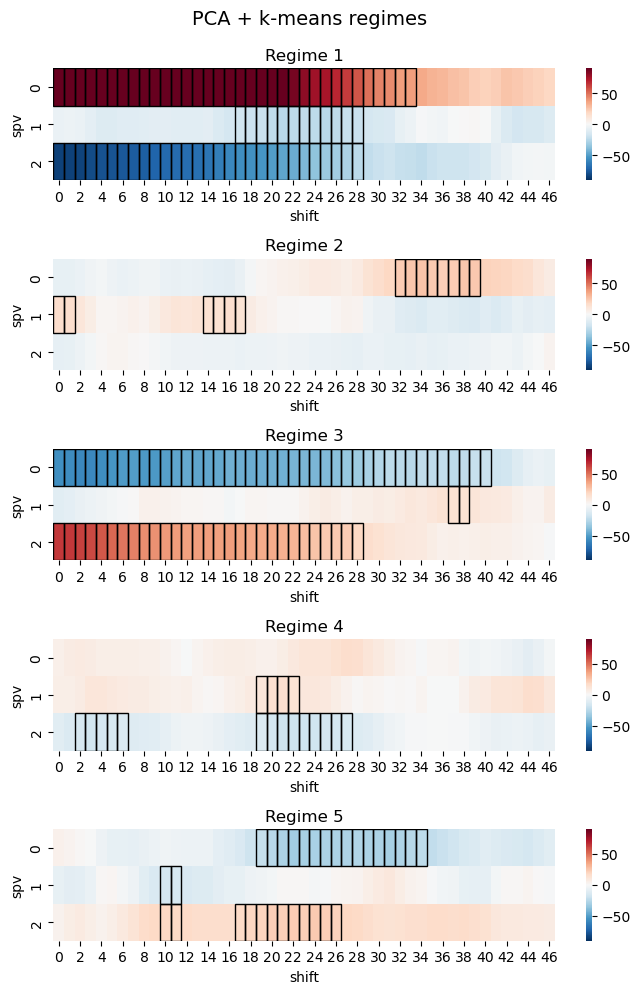

In [105]:
chosen_cluster_number = k

fig, axes = plt.subplots(chosen_cluster_number, 1, figsize=(7, 10))

for i in range(chosen_cluster_number):

    plot_data = probability_spv_pca[probability_spv_pca['label']==i]
    
    heatmap_data = pd.pivot_table(plot_data, values='mean', index=['spv'], columns='shift')
    
    g = sns.heatmap(heatmap_data, cmap='RdBu_r', square=False, ax = axes[i], vmin=-90, vmax = 90)
    g.set_title('Regime '+str(i+1))
    for index, row in plot_data[plot_data['significance'] == 1].iterrows():
        name_pos = heatmap_data.index.get_loc(row['spv'])
        id_pos = heatmap_data.columns.get_loc(row['shift'])
        g.add_patch(Rectangle((id_pos, name_pos), 1, 1, ec='black', fc='none', lw=1))
        
fig.suptitle('PCA + k-means regimes', fontsize=14, x=0.45, y=0.99)
plt.tight_layout()
plt.savefig('results_section3_1024/spv_pca_'+str(k)+'_percentage.png')

In [75]:
ce_spv_pca_ls = []

for shift in range(47):
    
    probs = sampled_spv_pca[sampled_spv_pca['shift']==shift]
    
    for i in range(500):
        
        sample_runs = probs['sample'].sample(n=400, replace=True, random_state=rng).values.tolist()
        sampled = probs[probs['sample'].isin(sample_runs)]

        #conditional_entropy = -np.mean(np.log(sampled['conditional_pc']).values)
        conditional_entropy = -np.mean(np.log2(sampled['conditional_pc']).values * sampled['conditional_pc'].values * 0.33)
 
        
        ce_df = pd.DataFrame(data={'Shift': [shift], 'Conditional Entropy': [conditional_entropy],
                                  'Method': ['PCA']})
        ce_spv_pca_ls.append(ce_df)
        
ce_spv_pca_df = pd.concat(ce_spv_pca_ls)

#### CMM-VAE

In [76]:
sampled_spv_cmm, probability_spv_cmm = spv_cassou_analysis(spv_regimes, 'cmm_labels', sample_n=500,
                                                           max_shift_value=47, k=k, spv_states=3)

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season']=0
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season'][i]=n
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: h

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A valu

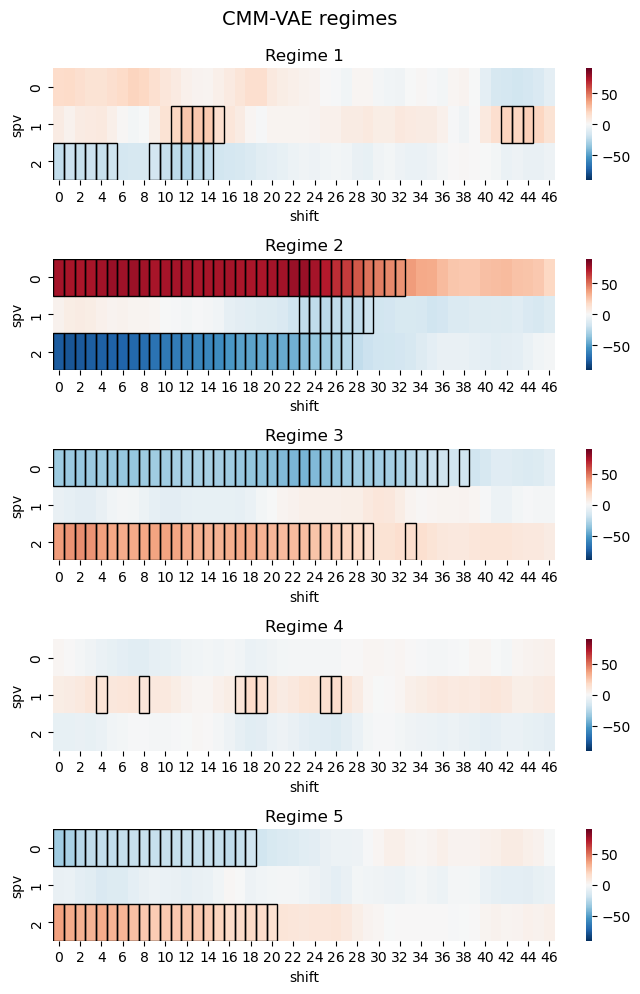

In [104]:
chosen_cluster_number = k

fig, axes = plt.subplots(chosen_cluster_number, 1, figsize=(7, 10))

for i in range(chosen_cluster_number):

    plot_data = probability_spv_cmm[probability_spv_cmm['label']==i]
    
    heatmap_data = pd.pivot_table(plot_data, values='mean', index=['spv'], columns='shift')
    
    g = sns.heatmap(heatmap_data, cmap='RdBu_r', square=False, ax = axes[i], vmin=-90, vmax = 90)
    g.set_title('Regime '+str(i+1))
    for index, row in plot_data[plot_data['significance'] == 1].iterrows():
        name_pos = heatmap_data.index.get_loc(row['spv'])
        id_pos = heatmap_data.columns.get_loc(row['shift'])
        g.add_patch(Rectangle((id_pos, name_pos), 1, 1, ec='black', fc='none', lw=1))
        
fig.suptitle('CMM-VAE regimes', fontsize=14, x=0.45, y=0.99)
plt.tight_layout()
plt.savefig('results_section3_1024/spv_cmmvae_'+str(k)+'_percentage.png')

In [78]:
ce_spv_cmm_ls = []

for shift in range(47):
    
    probs = sampled_spv_cmm[sampled_spv_cmm['shift']==shift]
    
    for i in range(500):
        
        sample_runs = probs['sample'].sample(n=400, replace=True, random_state=rng).values.tolist()
        sampled = probs[probs['sample'].isin(sample_runs)]

        #conditional_entropy = -np.mean(np.log(sampled['conditional_pc']).values)
        conditional_entropy = -np.mean(np.log2(sampled['conditional_pc']).values * sampled['conditional_pc'].values * 0.33)
        
        ce_df = pd.DataFrame(data={'Shift': [shift], 'Conditional Entropy': [conditional_entropy], 
                                   'Method': ['CMM-VAE']})
        ce_spv_cmm_ls.append(ce_df)
        
ce_spv_cmm_df = pd.concat(ce_spv_cmm_ls)

### CCA

In [79]:
sampled_spv_cca, probability_spv_cca = spv_cassou_analysis(spv_regimes, 'cca_labels', sample_n=500,
                                                           max_shift_value=47, k=k, spv_states=3)

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season']=0
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season'][i]=n
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: h

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/3612941823.py:23: SettingWithCopyWarning: 
A valu

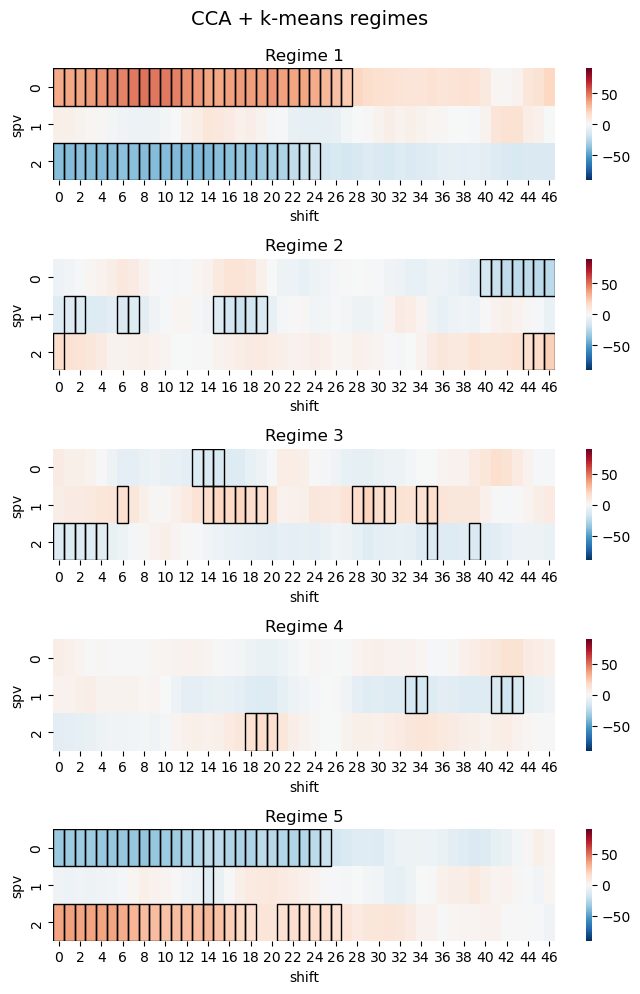

In [103]:
chosen_cluster_number = k

fig, axes = plt.subplots(chosen_cluster_number, 1, figsize=(7, 10))

for i in range(chosen_cluster_number):

    plot_data = probability_spv_cca[probability_spv_cca['label']==i]
    
    heatmap_data = pd.pivot_table(plot_data, values='mean', index=['spv'], columns='shift')
    
    g = sns.heatmap(heatmap_data, cmap='RdBu_r', square=False, ax = axes[i], vmin=-90, vmax = 90)
    g.set_title('Regime '+str(i+1))
    for index, row in plot_data[plot_data['significance'] == 1].iterrows():
        name_pos = heatmap_data.index.get_loc(row['spv'])
        id_pos = heatmap_data.columns.get_loc(row['shift'])
        g.add_patch(Rectangle((id_pos, name_pos), 1, 1, ec='black', fc='none', lw=1))
        
fig.suptitle('CCA + k-means regimes', fontsize=14, x=0.45, y=0.99)
plt.tight_layout()
plt.savefig('results_section3_1024/spv_cca_'+str(k)+'_percentage.png')

In [81]:
ce_spv_cca_ls = []

for shift in range(47):
    
    probs = sampled_spv_cca[sampled_spv_cca['shift']==shift]
    
    for i in range(500):
        
        sample_runs = probs['sample'].sample(n=400, replace=True, random_state=rng).values.tolist()
        sampled = probs[probs['sample'].isin(sample_runs)]

        #conditional_entropy = -np.mean(np.log(sampled['conditional_pc']).values)
        conditional_entropy = -np.mean(np.log2(sampled['conditional_pc']).values * sampled['conditional_pc'].values * 0.33)
        
        ce_df = pd.DataFrame(data={'Shift': [shift], 'Conditional Entropy': [conditional_entropy], 
                                   'Method': ['CCA']})
        ce_spv_cca_ls.append(ce_df)
        
ce_spv_cca_df = pd.concat(ce_spv_cca_ls)

### Conditional entropy plot

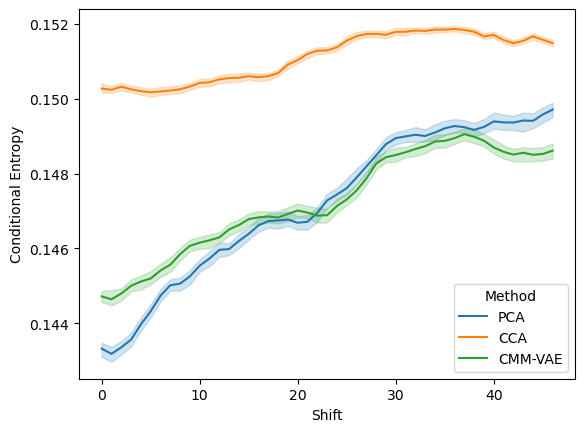

In [82]:
conditional_entropy_spv = pd.concat([ce_spv_pca_df, ce_spv_cca_df, ce_spv_cmm_df])
sns.lineplot(conditional_entropy_spv, x='Shift', y='Conditional Entropy', hue='Method', errorbar=('pi', 100))
plt.savefig('results_section3_1024/conditionalentropy_'+str(k)+'.png')

## Mutual information

In [84]:
from sklearn.metrics import adjusted_mutual_info_score

In [85]:
def get_shifted_df(dataframe, label_name, teleconnection, max_shift_value = 47):

    cassou = dataframe[['year', 'month', 'day', 'date', teleconnection, label_name]]

    # assign season
    cassou['season']=0
    n=1
    for i in range(len(cassou)):
        cassou['season'][i]=n
        if ((cassou['month'][i]==3) and (cassou['day'][i]==31)):
            n=n+1

    shifted_list = []

    for season in cassou['season'].unique():

        filtered = cassou[cassou['season']==season]

        for shift_value in range(max_shift_value):
            filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)

        shifted_list.append(filtered)

    cassou_shifted = pd.concat(shifted_list)
    
    cassou_shifted = cassou_shifted.drop(columns=['month', 'day', 'year'])

    cassou_shifted = pd.melt(cassou_shifted, 
                id_vars=['season', 'date', teleconnection], 
                value_vars=list(cassou_shifted.columns[4:]),
                var_name='shift', 
                value_name='shifted_label')
    
    return(cassou_shifted)

In [86]:
shifted_pca = get_shifted_df(dataframe = mjo_regimes, label_name = 'pca_labels', 
                             teleconnection = 'mjo phase revised')

ami_pca_ls = []

for shift in range(47):
    
    sampled = shifted_pca[shifted_pca['shift']==str(shift)]
    sampled = sampled[sampled['mjo phase revised']!=0]
    sampled = sampled.dropna()
    
    for n in range(100):
        
        seasons_sample = sampled['season'].sample(n=38, replace=True, random_state=rng).values.tolist()
        sample_runs = sampled[sampled['season'].isin(seasons_sample)]
        
        #sample_runs = sampled.sample(frac=0.9, replace=True, random_state=rng)
    
        ami = adjusted_mutual_info_score(sample_runs['shifted_label'].values, sample_runs['mjo phase revised'].values)
    
        ami_df = pd.DataFrame(data={'Shift': [shift], 'AMI': [ami],
                                  'Method': ['PCA']})
        ami_pca_ls.append(ami_df)
        
ami_pca_df = pd.concat(ami_pca_ls)

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season']=0
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season'][i]=n
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: ht

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A valu

In [87]:
shifted_cca = get_shifted_df(dataframe = mjo_regimes, label_name = 'cca_labels', 
                             teleconnection = 'mjo phase revised')

ami_cca_ls = []

for shift in range(47):
    
    sampled = shifted_cca[shifted_cca['shift']==str(shift)]
    sampled = sampled[sampled['mjo phase revised']!=0]
    sampled = sampled.dropna()
    
    for n in range(100):
        
        seasons_sample = sampled['season'].sample(n=40, replace=True, random_state=rng).values.tolist()
        sample_runs = sampled[sampled['season'].isin(seasons_sample)]
    
        ami = adjusted_mutual_info_score(sample_runs['shifted_label'].values, sample_runs['mjo phase revised'].values)

        ami_df = pd.DataFrame(data={'Shift': [shift], 'AMI': [ami],
                                      'Method': ['CCA']})
        ami_cca_ls.append(ami_df)
        
ami_cca_df = pd.concat(ami_cca_ls)

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season']=0
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season'][i]=n
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: ht

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A valu

In [88]:
shifted_cmm = get_shifted_df(dataframe = mjo_regimes, label_name = 'cmm_labels', 
                             teleconnection = 'mjo phase revised')

ami_cmm_ls = []

for shift in range(47):
    
    sampled = shifted_cmm[shifted_cmm['shift']==str(shift)]
    sampled = sampled[sampled['mjo phase revised']!=0]
    sampled = sampled.dropna()
    
    for n in range(100):
        
        seasons_sample = sampled['season'].sample(n=40, replace=True, random_state=rng).values.tolist()
        sample_runs = sampled[sampled['season'].isin(seasons_sample)]
    
        ami = adjusted_mutual_info_score(sample_runs['shifted_label'].values, sample_runs['mjo phase revised'].values)
    
        ami_df = pd.DataFrame(data={'Shift': [shift], 'AMI': [ami],
                                  'Method': ['CMM-VAE']})
        ami_cmm_ls.append(ami_df)
        
ami_cmm_df = pd.concat(ami_cmm_ls)

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season']=0
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season'][i]=n
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: ht

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A valu

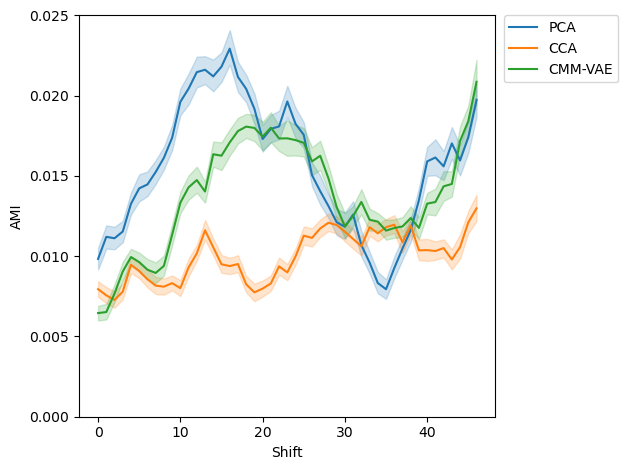

In [97]:
ami = pd.concat([ami_pca_df, ami_cca_df, ami_cmm_df])

sns.lineplot(ami, x='Shift', y='AMI', hue='Method', errorbar=('ci', 95))

plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.ylim(0, 0.025)
plt.tight_layout()
plt.savefig('results_section3_1024/ami_mjo_ci.png')

In [90]:
shifted_pca = get_shifted_df(dataframe = spv_regimes, label_name = 'pca_labels', 
                             teleconnection = 'spv')

ami_pca_ls_spv = []

for shift in range(47):
    
    sampled = shifted_pca[shifted_pca['shift']==str(shift)]
    sampled = sampled.dropna()
    
    for n in range(100):
        
        seasons_sample = sampled['season'].sample(n=40, replace=True, random_state=rng).values.tolist()
        sample_runs = sampled[sampled['season'].isin(seasons_sample)]
    
        ami = adjusted_mutual_info_score(sample_runs['shifted_label'].values, sample_runs['spv'].values)
    
        ami_df = pd.DataFrame(data={'Shift': [shift], 'AMI': [ami],
                                  'Method': ['PCA']})
        ami_pca_ls_spv.append(ami_df)
        
ami_pca_df_spv = pd.concat(ami_pca_ls_spv)

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season']=0
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season'][i]=n
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: ht

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A valu

In [91]:
shifted_cca = get_shifted_df(dataframe = spv_regimes, label_name = 'cca_labels', 
                             teleconnection = 'spv')

ami_cca_ls_spv = []

for shift in range(47):
    
    sampled = shifted_cca[shifted_cca['shift']==str(shift)]
    sampled = sampled.dropna()
    
    for n in range(100):
        
        seasons_sample = sampled['season'].sample(n=40, replace=True, random_state=rng).values.tolist()
        sample_runs = sampled[sampled['season'].isin(seasons_sample)]
    
        ami = adjusted_mutual_info_score(sample_runs['shifted_label'].values, sample_runs['spv'].values)
    
        ami_df = pd.DataFrame(data={'Shift': [shift], 'AMI': [ami],
                                  'Method': ['CCA']})
        ami_cca_ls_spv.append(ami_df)
        
ami_cca_df_spv = pd.concat(ami_cca_ls_spv)

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season']=0
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season'][i]=n
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: ht

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A valu

In [92]:
shifted_cmm = get_shifted_df(dataframe = spv_regimes, label_name = 'cmm_labels', 
                             teleconnection = 'spv')

ami_cmm_ls_spv = []

for shift in range(47):
    
    sampled = shifted_cmm[shifted_cmm['shift']==str(shift)]
    sampled = sampled.dropna()
    
    for n in range(100):
        
        seasons_sample = sampled['season'].sample(n=40, replace=True, random_state=rng).values.tolist()
        sample_runs = sampled[sampled['season'].isin(seasons_sample)]
    
        ami = adjusted_mutual_info_score(sample_runs['shifted_label'].values, sample_runs['spv'].values)

        ami_df = pd.DataFrame(data={'Shift': [shift], 'AMI': [ami],
                                      'Method': ['CMM-VAE']})
        ami_cmm_ls_spv.append(ami_df)
        
ami_cmm_df_spv = pd.concat(ami_cmm_ls_spv)

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season']=0
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cassou['season'][i]=n
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: ht

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A valu

/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered[str(shift_value)] = filtered[label_name].shift(-shift_value)
/var/folders/3g/80lqcgbn19l711ck1nnjxplr0000gn/T/ipykernel_27612/2408676168.py:20: SettingWithCopyWarning: 
A valu

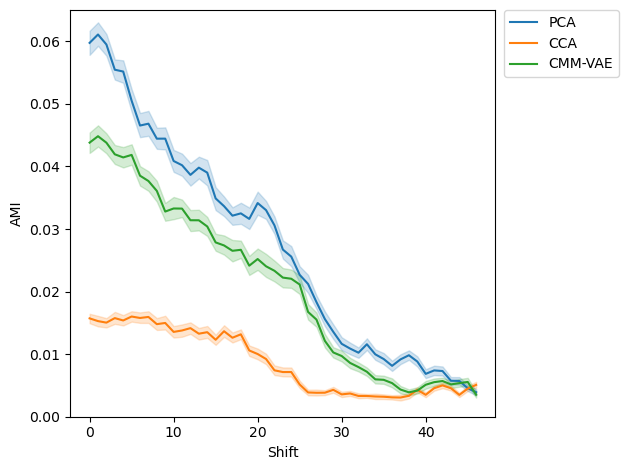

In [94]:
ami = pd.concat([ami_pca_df_spv, ami_cca_df_spv, ami_cmm_df_spv])

sns.lineplot(ami, x='Shift', y='AMI', hue='Method', errorbar=('ci', 95))

plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.ylim(0, 0.065)
plt.tight_layout()
plt.savefig('results_section3_1024/ami_spv_ci.png')